# Feature Based Exposure Grouping
We explore a feature-based exposure grouping algorithm:
- Compute keypoints in temporally adjacent exposures.
- Compute matches between them.
- Compute a homography and check that the induced norm of $H$ is below some $\epsilon$

## Alignment Coefficient
First, we load some test images:

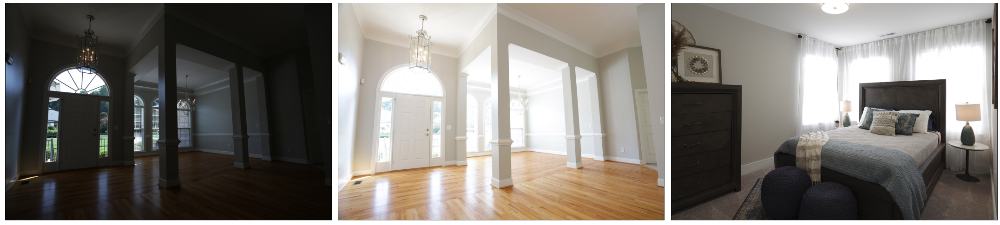

In [13]:
from imageio import imread
from matplotlib import pyplot as plt

# Load images
image_a = imread("../test/media/group/15.jpg")
image_b = imread("../test/media/group/16.jpg")
image_c = imread("../test/media/group/17.jpg")

# Plot
plt.figure(figsize=(30, 20))
plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(image_a)
plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(image_b)
plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(image_c)
plt.tight_layout()
plt.show()

Now, we detect features:

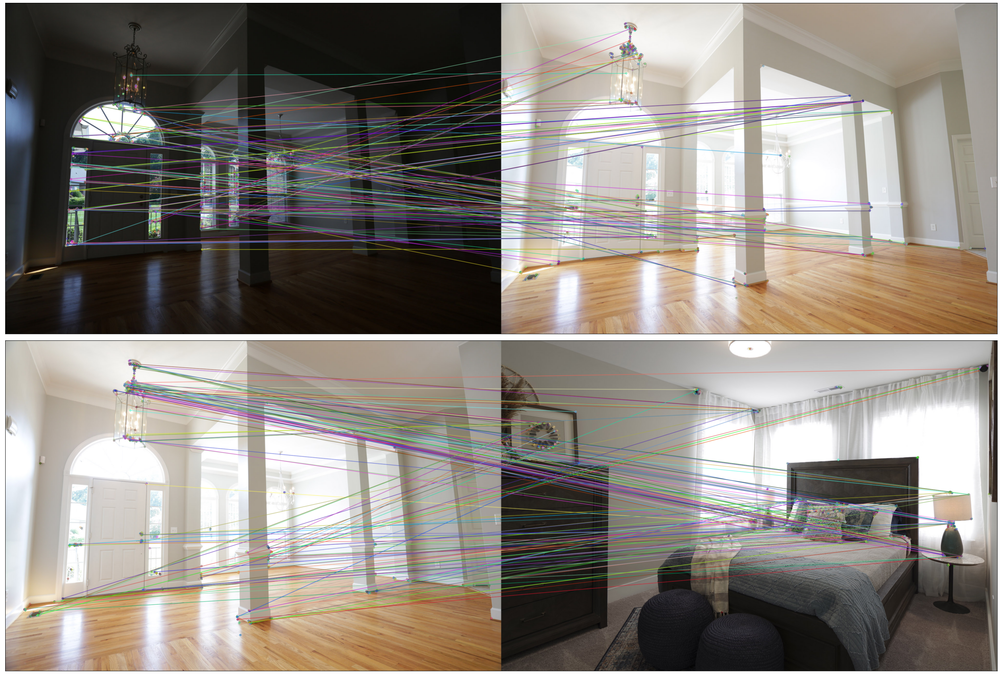

In [14]:
from cv2 import DescriptorMatcher_create, drawMatches, ORB_create, DESCRIPTOR_MATCHER_BRUTEFORCE_HAMMING

# Detect features
orb = ORB_create(1000)
keypoints_a, descriptors_a = orb.detectAndCompute(image_a, None)
keypoints_b, descriptors_b = orb.detectAndCompute(image_b, None)
keypoints_c, descriptors_c = orb.detectAndCompute(image_c, None)

# Match features
matcher = DescriptorMatcher_create(DESCRIPTOR_MATCHER_BRUTEFORCE_HAMMING)
matches_ab = matcher.match(descriptors_a, descriptors_b, None)
matches_bc = matcher.match(descriptors_b, descriptors_c, None)

# Extract top k
matches_ab = sorted(matches_ab, key=lambda x: x.distance)
matches_bc = sorted(matches_bc, key=lambda x: x.distance)
matches_ab = matches_ab[:int(len(matches_ab) * 0.15)]
matches_bc = matches_ab[:int(len(matches_bc) * 0.15)]

# Draw matches
image_matches_ab = drawMatches(image_a, keypoints_a, image_b, keypoints_b, matches_ab, None)
image_matches_bc = drawMatches(image_b, keypoints_b, image_c, keypoints_c, matches_bc, None)
plt.figure(figsize=(30, 20))
plt.subplot(2, 1, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(image_matches_ab, interpolation="bilinear")
plt.subplot(2, 1, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(image_matches_bc, interpolation="bilinear")
plt.tight_layout()
plt.show()

Now, we compute homographies between the pairs:

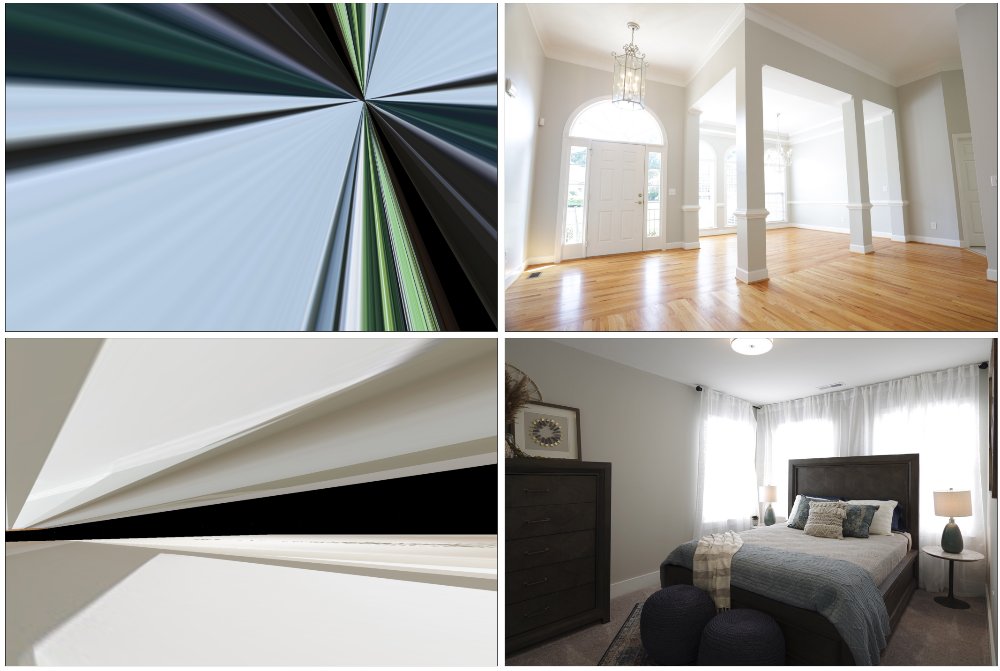

In [15]:
from cv2 import findHomography, warpPerspective, RANSAC
from numpy import array

# Compute homography
H_ab, _ = findHomography(
    array([keypoints_a[match.queryIdx].pt for match in matches_ab]),
    array([keypoints_b[match.trainIdx].pt for match in matches_ab]),
    RANSAC
)
H_bc, _ = findHomography(
    array([keypoints_b[match.queryIdx].pt for match in matches_bc]),
    array([keypoints_c[match.trainIdx].pt for match in matches_bc]),
    RANSAC
)

# Warp
warped_a = warpPerspective(image_a, H_ab, image_b.shape[:2][::-1])
warped_b = warpPerspective(image_b, H_bc, image_c.shape[:2][::-1])

# Plot
plt.figure(figsize=(30, 20))
plt.subplot(2, 2, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(warped_a, interpolation="bilinear")
plt.subplot(2, 2, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(image_b, interpolation="bilinear")
plt.subplot(2, 2, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(warped_b, interpolation="bilinear")
plt.subplot(2, 2, 4)
plt.xticks([])
plt.yticks([])
plt.imshow(image_c, interpolation="bilinear")
plt.tight_layout()
plt.show()

Clearly, ORB is not robust to exposure differences. We can quantify the failures above using the *alignment coefficient*, defined as:
\begin{align}
    \phi(H_{ab}) = \vert \Vert H_{ab} \Vert_2 - \Vert I \Vert_2 \vert
\end{align}

Where $H_{ab} \in \mathbb{R}^{3 \times 3}$ is the approximate homography mapping an image $a$ to image $b$ and $\phi(\cdot): \mathbb{R}^{3 \times 3} \mapsto \mathbb{R}^{+}$. We expect that for a correct image pair, $\phi(H) \approx 0$.

## Normalized Exposure Alignment Coefficient
We use the histogram matchiing trick from edge-based exposure grouping: